**CODE FOR PRE PROCESSING**

Loading the dataset

In [3]:
import os

# Define the path to your dataset
dataset_path = '/Users/poojithabommu/desktop/DIP Final'

Importing Libraries

In [11]:
!pip install tensorflow
import os
import random
import hashlib
import shutil
import os
import random
import numpy as np
import pandas as pd
from PIL import Image
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from collections import defaultdict
from PIL import Image, UnidentifiedImageError
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.6/239.6 MB 23.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.1/11.1 MB 20.5 MB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.8/25.8 MB 21.6 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 13.5 MB/s eta 0:00:00a 0:00:01


**Visualisation**

**Displaying sample from classes**

Found 6 classes: ['Shine', 'fogsmog', 'lightning', 'rain', 'sandstorm', 'snow']
Class: Shine, Image: shine22.jpg, Path: /Users/poojithabommu/desktop/DIP Final/Shine/shine22.jpg
Class: Shine, Image: shine36.jpg, Path: /Users/poojithabommu/desktop/DIP Final/Shine/shine36.jpg
Class: Shine, Image: shine128.jpg, Path: /Users/poojithabommu/desktop/DIP Final/Shine/shine128.jpg
Class: Shine, Image: shine114.jpg, Path: /Users/poojithabommu/desktop/DIP Final/Shine/shine114.jpg
Class: Shine, Image: shine100.jpg, Path: /Users/poojithabommu/desktop/DIP Final/Shine/shine100.jpg
Class: fogsmog, Image: 4217.jpg, Path: /Users/poojithabommu/desktop/DIP Final/fogsmog/4217.jpg
Class: fogsmog, Image: 4571.jpg, Path: /Users/poojithabommu/desktop/DIP Final/fogsmog/4571.jpg
Class: fogsmog, Image: 4565.jpg, Path: /Users/poojithabommu/desktop/DIP Final/fogsmog/4565.jpg
Class: fogsmog, Image: 4203.jpg, Path: /Users/poojithabommu/desktop/DIP Final/fogsmog/4203.jpg
Class: fogsmog, Image: 4559.jpg, Path: /Users/poo

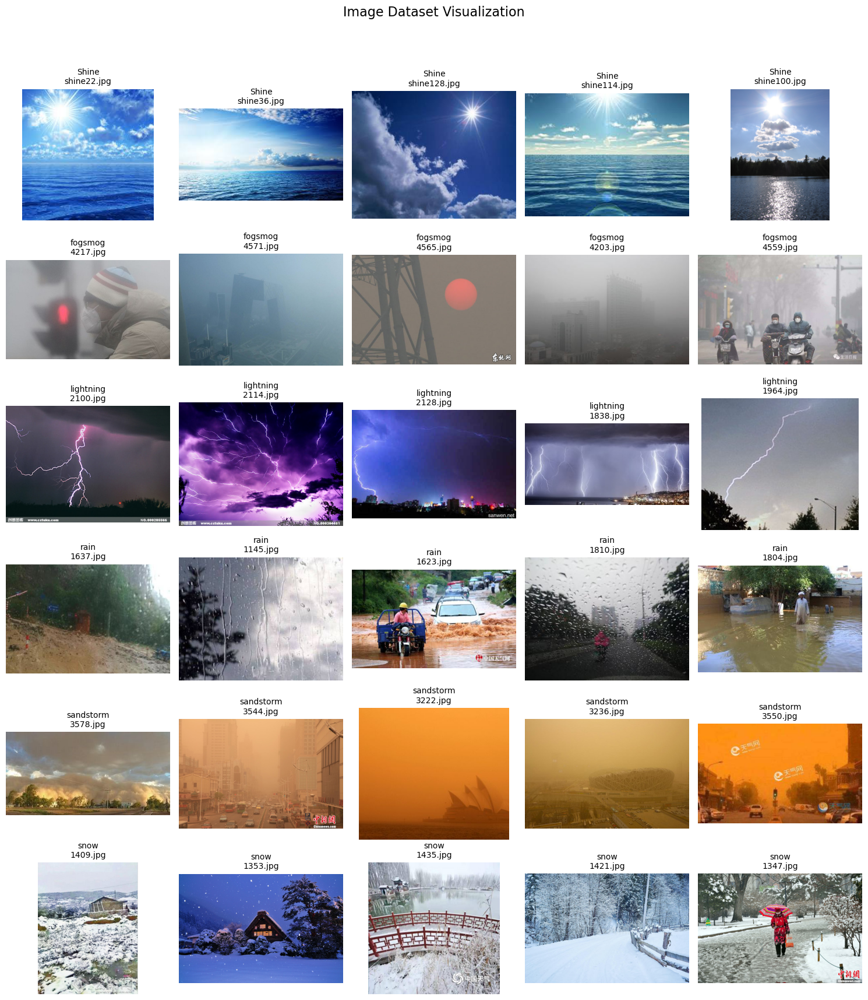

In [12]:


def display_images_from_folders(dataset_path, classes, images_per_class=5):
    # Number of classes in the dataset
    num_classes = len(classes)
    # Create a figure with subplots where the number of rows equals the number of classes and the number of columns equals the number of images to display per class.
    fig, axes = plt.subplots(num_classes, images_per_class, figsize=(images_per_class * 3, num_classes * 3))
    # Set the overall title for the figure
    fig.suptitle('Image Dataset Visualization', fontsize=16)

    for class_idx, class_name in enumerate(classes):
        class_path = os.path.join(dataset_path, class_name)

        # Get list of image files in the class directory
        image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]

        if not image_files:
            print(f"No images found in {class_name}.")
            continue

        for img_idx in range(images_per_class):
            ax = axes[class_idx, img_idx] if num_classes > 1 else axes[img_idx]

            # Handle cases where there are fewer images than images_per_class
            if img_idx < len(image_files):
                img_name = image_files[img_idx]
                img_path = os.path.join(class_path, img_name)

                try:
                    img = Image.open(img_path)
                    ax.imshow(img)
                    ax.set_title(f"{class_name}\n{img_name}", fontsize=10)
                    ax.axis('off')

                    # Optional: Print image details
                    print(f"Class: {class_name}, Image: {img_name}, Path: {img_path}")
                except Exception as e:
                    print(f"Error loading image {img_path}: {e}")
                    ax.axis('off')
            else:
                ax.axis('off')  # Hide axes if no image is available

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
    plt.show()

# Define the path to your dataset
dataset_path = '/Users/poojithabommu/desktop/DIP Final'

# Get the list of class directories
classes = sorted([d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))])
num_classes = len(classes)

print(f"Found {num_classes} classes: {classes}")

# Number of images to display per class
images_per_class = 5  

# Display the images
display_images_from_folders(dataset_path, classes, images_per_class)


These are the images present in our dataset.

**Displaying the count of images per class**

In [15]:


# Initialize a dictionary to hold image counts per class

def count_images_per_class(dataset_path):
  class_image_counts = {}
  for class_name in classes:
      class_path = os.path.join(dataset_path, class_name)

      # List all image files in the class directory
      image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]

      # Count the number of images
      image_count = len(image_files)

      # Store the count in the dictionary
      class_image_counts[class_name] = image_count

  return class_image_counts
image_counts_before = count_images_per_class(dataset_path)
# Optional: Display counts in a table using pandas
df_counts = pd.DataFrame(list(image_counts_before.items()), columns=['Class', 'Image Count'])
print("\nImage Counts per Class:")
print(df_counts)


Image Counts per Class:
       Class  Image Count
0      Shine          253
1    fogsmog          851
2  lightning          377
3       rain          526
4  sandstorm          692
5       snow          621


The Fogsmog class has the most images, followed by Sandstorm and Rain, suggesting that these weather conditions are more prevalent in the dataset. On the other hand, the Shine class is underrepresented. To prevent biased predictions favoring the more frequent classes, techniques such as oversampling or undersampling may be needed to balance the dataset

**Showing the count using bar plot**

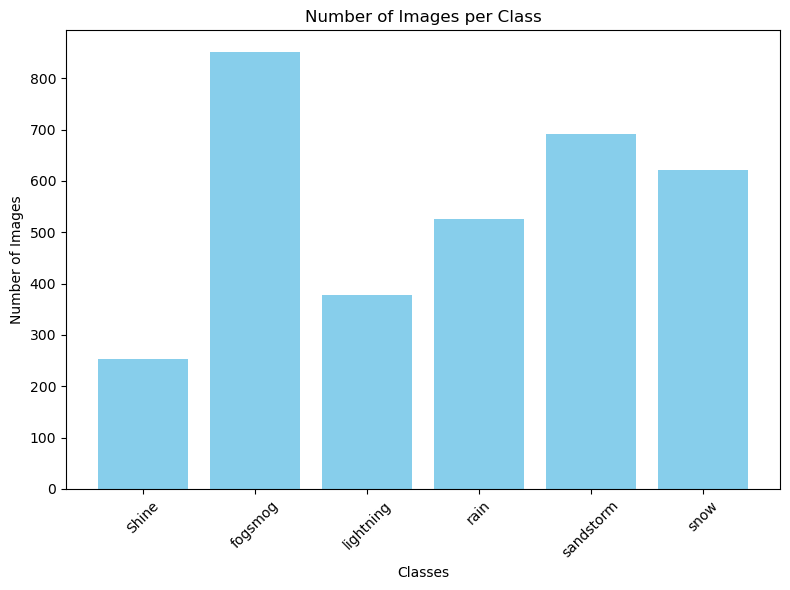

In [17]:
# Plotting the image counts
plt.figure(figsize=(8, 6))
plt.bar(image_counts_before.keys(), image_counts_before.values(), color='skyblue')
plt.xlabel('Classes')
plt.ylabel('Number of Images')
plt.title('Number of Images per Class')
plt.xticks(rotation=45)  # Rotate class names if they are long
plt.tight_layout()
plt.show()


**Checking & Removing Duplicates**

In [19]:
#Computes a hash for a file using the specified hashing algorithm (default: SHA-256).  
# Returns the hexadecimal hash string of the file content.
def compute_file_hash(file_path, hash_func=hashlib.sha256):
    # Initialize the hash object
    hash_object = hash_func()
    # Open the file in binary read mode
    with open(file_path, 'rb') as f:
         # Read the file in 4KB chunks
        for chunk in iter(lambda: f.read(4096), b""):
            hash_object.update(chunk)# Update the hash with the current chunk
    return hash_object.hexdigest()
#Computes a perceptual hash (pHash) for an image to detect visual similarities.  
#Returns a perceptual hash object for the image (default hash grid size: 8).
def compute_perceptual_hash(image_path, hash_size=8):
    with Image.open(image_path) as img:
        return imagehash.phash(img, hash_size=hash_size)# Compute the pHash
#Finiding the duplicates
def find_exact_duplicates(dataset_path):
    hash_dict = defaultdict(list) # Dictionary to store file paths grouped by their hash
    #Allowing multiple supporting formats
    supported_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.gif')
    # Iterate through class directories
    for class_name in sorted(os.listdir(dataset_path)):
        class_path = os.path.join(dataset_path, class_name)
        if not os.path.isdir(class_path):# Skip non-directory entries
            continue
        # Iterate through images in each class
        for img_name in os.listdir(class_path):
            if not img_name.lower().endswith(supported_extensions):
                continue

            img_path = os.path.join(class_path, img_name)
            try:
                # Compute hash for the image
                img_hash = compute_file_hash(img_path)
                # Group file paths by their hash
                hash_dict[img_hash].append(img_path)
            except Exception as e:
                print(f"Error processing {img_path}: {e}")
    # Filter out hash groups with only one file (no duplicates)
    duplicates = {hash_val: paths for hash_val, paths in hash_dict.items() if len(paths) > 1}
    return duplicates

#Displays exact duplicate files and optionally visualizes them.
def display_exact_duplicates(duplicates):
    if not duplicates: Check if any duplicates are found
        print("No exact duplicates found.")
        return
    #Priinting duplicates
    print(f"Found {len(duplicates)} sets of exact duplicates.\n")
      # Visualize duplicate images
    for hash_val, paths in duplicates.items():
        print(f"Duplicate Set (Hash: {hash_val}):")
        for path in paths:
            print(f" - {path}")
        print("\n")
    # Visualize duplicates
    for hash_val, paths in duplicates.items():
        fig, axes = plt.subplots(1, len(paths), figsize=(5 * len(paths), 5))
        fig.suptitle(f'Exact Duplicates (Hash: {hash_val})', fontsize=16)

        for ax, img_path in zip(axes, paths):
            try:
                img = Image.open(img_path)
                ax.imshow(img)#Display image
                ax.set_title(os.path.basename(img_path))
                ax.axis('off')#Remove axis labels
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")
                ax.axis('off')

        plt.show()
#  Counts the number of image files in each class directory.
def count_images_per_class(dataset_path):
    class_image_counts = {}
    supported_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.gif')

    for class_name in sorted(os.listdir(dataset_path)):
        class_path = os.path.join(dataset_path, class_name)
        if not os.path.isdir(class_path):
            continue

        image_files = [f for f in os.listdir(class_path) if f.lower().endswith(supported_extensions)]
        image_count = len(image_files)
        class_image_counts[class_name] = image_count

    return class_image_counts
#Visualizes the number of images per class in a bar chart.
def visualize_image_counts(class_image_counts):
    if not class_image_counts:
        print("No classes found to visualize.")
        return

    # Create a pandas DataFrame for better visualization
    df_counts = pd.DataFrame(list(class_image_counts.items()), columns=['Class', 'Image Count'])
    print("\nImage Counts per Class:")
    print(df_counts)

    # Plotting the image counts
    plt.figure(figsize=(10, 6))
    plt.bar(class_image_counts.keys(), class_image_counts.values(), color='skyblue')
    plt.xlabel('Classes')
    plt.ylabel('Number of Images')
    plt.title('Number of Images per Class')
    plt.xticks(rotation=45)  # Rotate class names if they are long
    plt.tight_layout()
    plt.show()

# Displays a specified number of images from each class in a grid.
def display_images_from_folders(dataset_path, classes, images_per_class=5):
    num_classes = len(classes)
    fig, axes = plt.subplots(num_classes, images_per_class, figsize=(images_per_class * 3, num_classes * 3))
    fig.suptitle('Image Dataset Visualization', fontsize=16)
    # Iterate through each class
    for class_idx, class_name in enumerate(classes):
        class_path = os.path.join(dataset_path, class_name)

        image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]

        if not image_files:
            print(f"No images found in {class_name}.")
            continue

        # Optional: Randomly sample images to display
        if len(image_files) > images_per_class:
            image_files = random.sample(image_files, images_per_class)
        else:
            image_files = sorted(image_files)  # Sort to maintain consistency

        for img_idx in range(images_per_class):
            ax = axes[class_idx, img_idx] if num_classes > 1 else axes[img_idx]

            # Handle cases where there are fewer images than images_per_class
            if img_idx < len(image_files):
                img_name = image_files[img_idx]
                img_path = os.path.join(class_path, img_name)

                try:
                    img = Image.open(img_path)
                    ax.imshow(img)
                    ax.set_title(f"{class_name}\n{img_name}", fontsize=10)
                    ax.axis('off')

                    # Optional: Print image details
                    print(f"Class: {class_name}, Image: {img_name}, Path: {img_path}")
                except Exception as e:
                    print(f"Error loading image {img_path}: {e}")
                    ax.axis('off')
            else:
                ax.axis('off')  # Hide axes if no image is available

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
    plt.show()



Found 60 sets of exact duplicates.

Duplicate Set (Hash: 6d694b7927fbcacc3ce761fedb6388ea72cff7b46d00aa6601fce18ecba48c8d):
 - /Users/poojithabommu/desktop/DIP Final/Shine/shine36.jpg
 - /Users/poojithabommu/desktop/DIP Final/Shine/shine21.jpg


Duplicate Set (Hash: 5bc2ed5240c30db558fe452281813f1c89b156f5f7146909f1c42e139a76a780):
 - /Users/poojithabommu/desktop/DIP Final/Shine/shine115.jpg
 - /Users/poojithabommu/desktop/DIP Final/Shine/shine25.jpg


Duplicate Set (Hash: 81cedbeb6b5b902c4a8e96222ee4ebbe5eeb89c03b03577e1a08465ff33794ec):
 - /Users/poojithabommu/desktop/DIP Final/Shine/shine49.jpg
 - /Users/poojithabommu/desktop/DIP Final/Shine/shine98.jpg


Duplicate Set (Hash: 313f5495995f4ea1a3331f5f69a948eb96ab4cf04787bc366cf6d2fafa22d4fc):
 - /Users/poojithabommu/desktop/DIP Final/fogsmog/4405.jpg
 - /Users/poojithabommu/desktop/DIP Final/fogsmog/4395.jpg


Duplicate Set (Hash: 9214916bca986b16170899204bea28f68186b8c75b57746a8d570e8418ed975c):
 - /Users/poojithabommu/desktop/DIP F

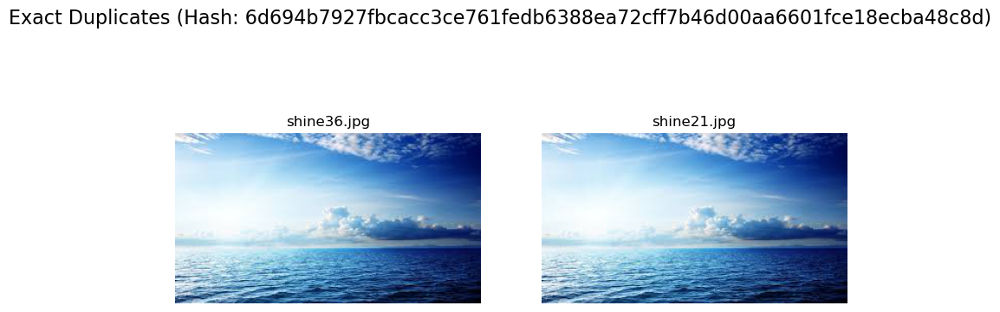

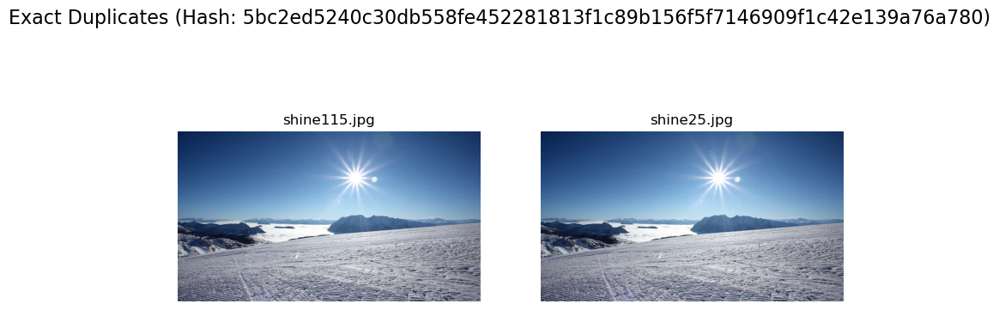

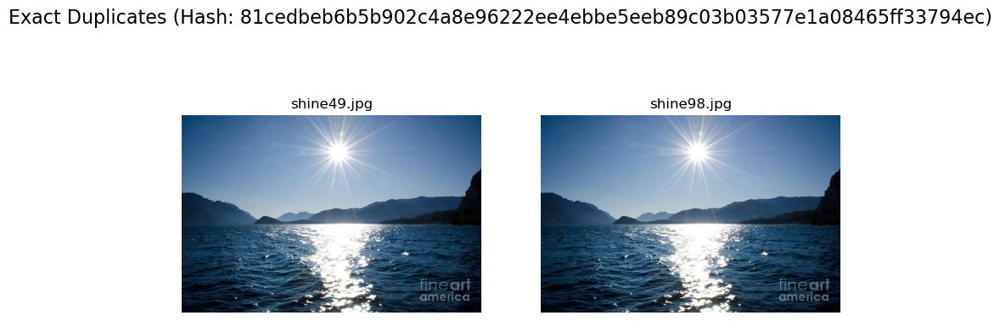

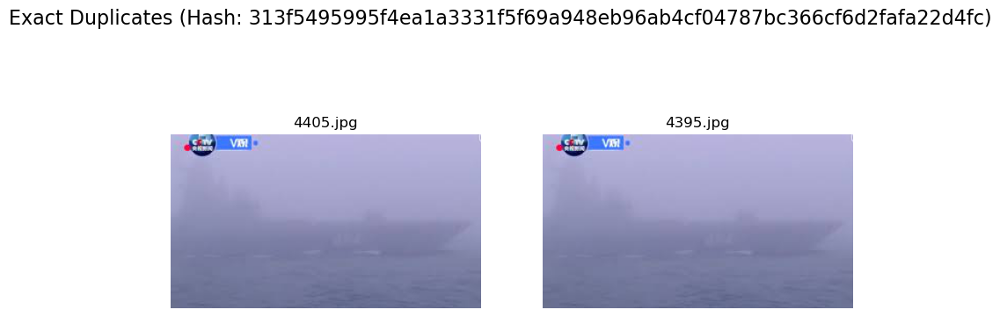

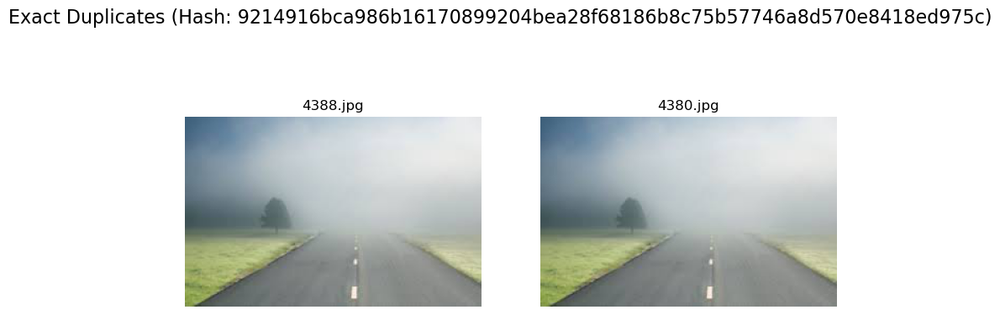

...

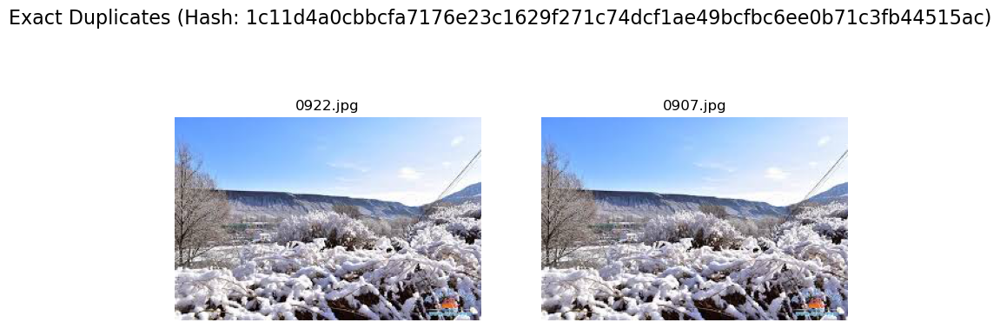

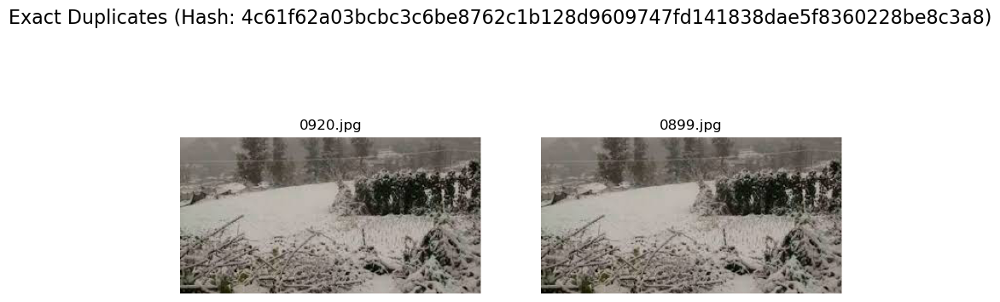

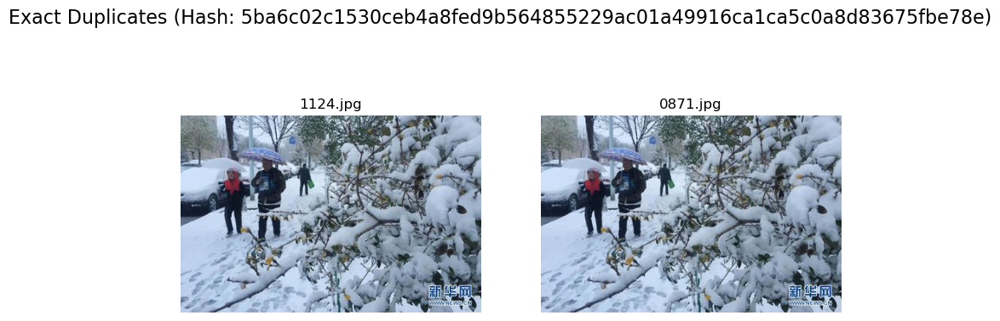

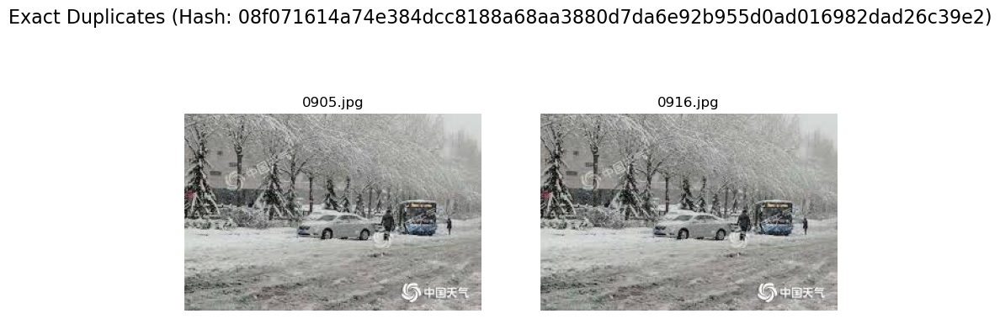

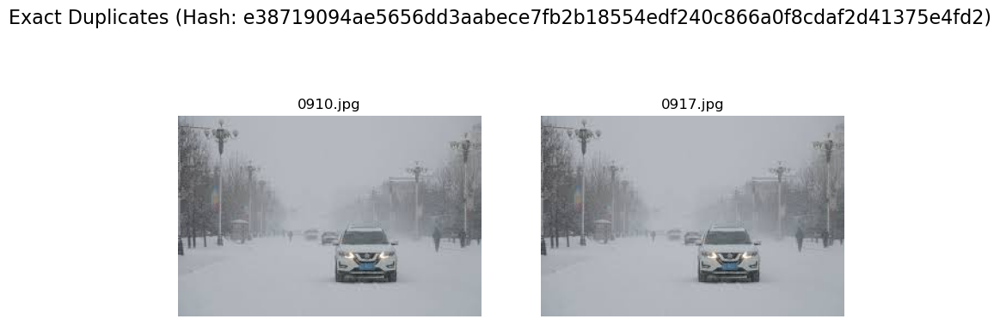

In [21]:


# Step 3: Find and display exact duplicates
exact_duplicates = find_exact_duplicates(dataset_path)
display_exact_duplicates(exact_duplicates)


We have found 60 sets of duplicates. Now we are trying to remove duplicates

**Removing Duplicates**

In [22]:
def remove_exact_duplicates(duplicates, keep='first'):

    for hash_val, paths in duplicates.items():
        if keep == 'first':
            # Keep the first image, remove the rest
            for path in paths[1:]:
                try:
                    os.remove(path)
                    print(f"Removed duplicate: {path}")
                except Exception as e:
                    print(f"Error removing {path}: {e}")
        elif keep == 'last':
            # Keep the last image, remove the rest
            for path in paths[:-1]:
                try:
                    os.remove(path)
                    print(f"Removed duplicate: {path}")
                except Exception as e:
                    print(f"Error removing {path}: {e}")
        else:
            print("Invalid value for 'keep'. Use 'first' or 'last'.")

In [15]:
# Remove exact duplicates, keeping the first occurrence
remove_exact_duplicates(exact_duplicates, keep='first')

Removed duplicate: /Users/harshithakesani/Downloads/DIP Final/Shine/shine21.jpg
Removed duplicate: /Users/harshithakesani/Downloads/DIP Final/Shine/shine25.jpg
Removed duplicate: /Users/harshithakesani/Downloads/DIP Final/Shine/shine98.jpg
Removed duplicate: /Users/harshithakesani/Downloads/DIP Final/fogsmog/4395.jpg
Removed duplicate: /Users/harshithakesani/Downloads/DIP Final/fogsmog/4380.jpg
Removed duplicate: /Users/harshithakesani/Downloads/DIP Final/fogsmog/4424.jpg
Removed duplicate: /Users/harshithakesani/Downloads/DIP Final/fogsmog/4394.jpg
Removed duplicate: /Users/harshithakesani/Downloads/DIP Final/fogsmog/4522.jpg
Removed duplicate: /Users/harshithakesani/Downloads/DIP Final/fogsmog/4420.jpg
Removed duplicate: /Users/harshithakesani/Downloads/DIP Final/fogsmog/4429.jpg
Removed duplicate: /Users/harshithakesani/Downloads/DIP Final/fogsmog/4422.jpg
Removed duplicate: /Users/harshithakesani/Downloads/DIP Final/fogsmog/4456.jpg
Removed duplicate: /Users/harshithakesani/Downloa

**Classes count after removing duplicates**

In [25]:
class_image_counts=count_images_per_class(dataset_path)
df_counts = pd.DataFrame(list(class_image_counts.items()), columns=['Class', 'Image Count'])
print("\nImage Counts per Class:")
print(df_counts)


Image Counts per Class:
       Class  Image Count
0      Shine          253
1    fogsmog          851
2  lightning          377
3       rain          526
4  sandstorm          692
5       snow          621


Here, the duplicates are removed and counts of classes after removing duplicates are printed above.

**Balancing data using Oversampling & Data Augumentation** 

In [31]:

# Function to copy original images and augment them into a single output folder per class
def copy_and_augment_images(dataset_path, output_dir, target_count_per_class):
    # Define augmentation generator
    datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    # Iterate over each class folder in the dataset
    for class_name in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_name)
        if os.path.isdir(class_path):
            # Create a corresponding class directory in the output folder
            output_class_dir = os.path.join(output_dir, class_name)
            os.makedirs(output_class_dir, exist_ok=True)

            # Copy original images to the output folder
            images = [img for img in os.listdir(class_path) if img.endswith(('.jpg', '.png'))]
            for img in images:
                shutil.copy(os.path.join(class_path, img), output_class_dir)

            print(f"Copied {len(images)} original images for class: {class_name}")

            # Perform augmentation to meet the target count
            current_count = len(images)
            generated_count = 0
            while current_count + generated_count < target_count_per_class:
                # Randomly pick an image to augment
                img_path = random.choice(images)
                img = load_img(os.path.join(class_path, img_path))  # Load the image
                img_array = img_to_array(img)  # Convert to numpy array
                img_array = img_array.reshape((1,) + img_array.shape)  # Add batch dimension

                # Generate augmented images
                for batch in datagen.flow(
                    img_array,
                    batch_size=1,
                    save_to_dir=output_class_dir,
                    save_prefix='aug',
                    save_format='jpg'
                ):
                    generated_count += 1
                    if current_count + generated_count >= target_count_per_class:
                        break

            print(f"Generated {generated_count} augmented images for class: {class_name}")

# Parameters
dataset_path = "/Users/poojithabommu/desktop/DIP Final" # Path to the original dataset
output_dir = "/Users/poojithabommu/desktop/Aug_data_2"   # Path to save combined dataset (original + augmented images)
target_count_per_class = 851  # Desired number of images per class

# Run the function
copy_and_augment_images(dataset_path, output_dir, target_count_per_class)


Copied 377 original images for class: lightning
Generated 474 augmented images for class: lightning
Copied 692 original images for class: sandstorm
Generated 159 augmented images for class: sandstorm
Copied 526 original images for class: rain
Generated 325 augmented images for class: rain
Copied 253 original images for class: Shine
Generated 598 augmented images for class: Shine
Copied 851 original images for class: fogsmog
Generated 0 augmented images for class: fogsmog
Copied 621 original images for class: snow
Generated 230 augmented images for class: snow


This code takes the original images from each class in the dataset and augments them to reach a target number of images per class. It uses image transformation techniques like rotation, shifting, and flipping to generate additional images, saving both original and augmented images into a new output folder. 


These augmentation parameters simulate real-world variations in images, using DIP techniques. rotation_range and shear_range test the model's robustness to geometric transformations, while width_shift_range, height_shift_range, and zoom_range simulate changes in perspective and scale. horizontal_flip creates mirrored images, and fill_mode='nearest' fills any gaps from transformations using the nearest pixel.

**Count after balancing the dataset**

In [33]:
class_image_counts=count_images_per_class(output_dir)
df_counts = pd.DataFrame(list(class_image_counts.items()), columns=['Class', 'Image Count'])
print("\nImage Counts per Class:")
print(df_counts)


Image Counts per Class:
       Class  Image Count
0      Shine          835
1    fogsmog          851
2  lightning          840
3       rain          850
4  sandstorm          851
5       snow          846


The dataset has been balanced, with each class now having a comparable number of images, ranging from 835 to 851. This balance prevents any class from being underrepresented, reducing the risk of bias in model training. The more uniform distribution of data is advantageous for improving model fairness and accuracy.

**Displaying Images**

Found 6 classes: ['Shine', 'fogsmog', 'lightning', 'rain', 'sandstorm', 'snow']
Class: Shine, Image: aug_0_1809.jpg, Path: /Users/poojithabommu/desktop/Aug_data_final/Shine/aug_0_1809.jpg
Class: Shine, Image: aug_0_51.jpg, Path: /Users/poojithabommu/desktop/Aug_data_final/Shine/aug_0_51.jpg
Class: Shine, Image: shine22.jpg, Path: /Users/poojithabommu/desktop/Aug_data_final/Shine/shine22.jpg
Class: Shine, Image: aug_0_3763.jpg, Path: /Users/poojithabommu/desktop/Aug_data_final/Shine/aug_0_3763.jpg
Class: Shine, Image: shine36.jpg, Path: /Users/poojithabommu/desktop/Aug_data_final/Shine/shine36.jpg
Class: fogsmog, Image: 4217.jpg, Path: /Users/poojithabommu/desktop/Aug_data_final/fogsmog/4217.jpg
Class: fogsmog, Image: 4571.jpg, Path: /Users/poojithabommu/desktop/Aug_data_final/fogsmog/4571.jpg
Class: fogsmog, Image: 4565.jpg, Path: /Users/poojithabommu/desktop/Aug_data_final/fogsmog/4565.jpg
Class: fogsmog, Image: 4203.jpg, Path: /Users/poojithabommu/desktop/Aug_data_final/fogsmog/4203.

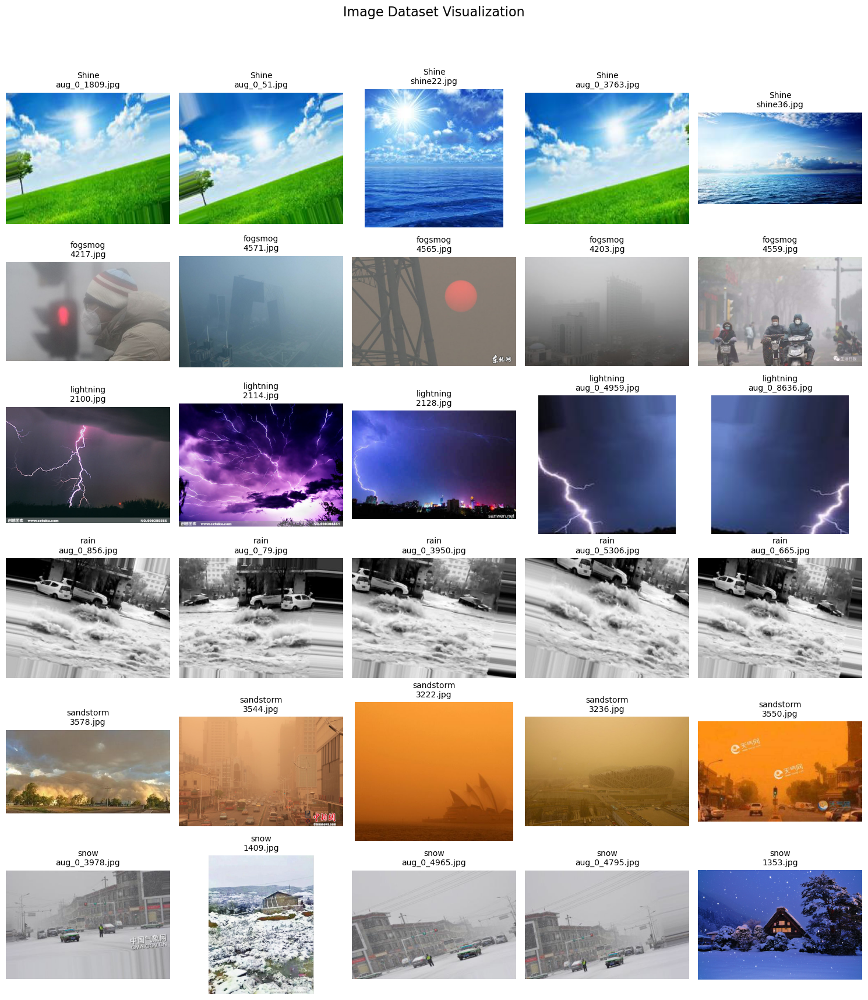

In [37]:
def display_images_from_folders(dataset_path, classes, images_per_class=5):

    num_classes = len(classes)
    fig, axes = plt.subplots(num_classes, images_per_class, figsize=(images_per_class * 3, num_classes * 3))
    fig.suptitle('Image Dataset Visualization', fontsize=16)

    for class_idx, class_name in enumerate(classes):
        class_path = os.path.join(dataset_path, class_name)

        # Get list of image files in the class directory
        image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]

        if not image_files:
            print(f"No images found in {class_name}.")
            continue

        for img_idx in range(images_per_class):
            ax = axes[class_idx, img_idx] if num_classes > 1 else axes[img_idx]

            # Handle cases where there are fewer images than images_per_class
            if img_idx < len(image_files):
                img_name = image_files[img_idx]
                img_path = os.path.join(class_path, img_name)

                try:
                    img = Image.open(img_path)
                    ax.imshow(img)
                    ax.set_title(f"{class_name}\n{img_name}", fontsize=10)
                    ax.axis('off')

                    # Optional: Print image details
                    print(f"Class: {class_name}, Image: {img_name}, Path: {img_path}")
                except Exception as e:
                    print(f"Error loading image {img_path}: {e}")
                    ax.axis('off')
            else:
                ax.axis('off')  # Hide axes if no image is available

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
    plt.show()

# Define the path to your dataset
dataset_path = "/Users/poojithabommu/desktop/Aug_data_final"   # Replace with your dataset path, e.g., './dataset']


# Get the list of class directories
classes = sorted([d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))])
num_classes = len(classes)

print(f"Found {num_classes} classes: {classes}")

# Number of images to display per class
images_per_class = 5  # Adjust as needed

# Display the images
display_images_from_folders(dataset_path, classes, images_per_class)


**Resizing Images**

In [39]:

#Resizes all images in a dataset folder to a specified target size.
def resize_images_in_folder(dataset_path, target_size):
   
    for class_name in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_name)
        # Process only if the path is a directory
        if os.path.isdir(class_path):
            print(f"Resizing images in class: {class_name}")
            # Iterate through all files in the class directory
            for image_name in os.listdir(class_path):
                image_path = os.path.join(class_path, image_name)
                # Process only supported image file formats
                if image_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                    try:
                        # Open the image
                        with Image.open(image_path) as img:
                            # Convert to RGB if the image is not in RGB mode
                            if img.mode != 'RGB':
                                img = img.convert('RGB')
                            # Resize the image
                            resized_img = img.resize(target_size, Image.Resampling.LANCZOS)
                            # Save the resized image (overwrite the original)
                            resized_img.save(image_path, format="JPEG")
                    except UnidentifiedImageError:
                        print(f"Skipping invalid image file: {image_path}")
                    except Exception as e:
                        print(f"Error resizing image {image_path}: {e}")
            print(f"Finished resizing images in class: {class_name}")

# Parameters
output_dir = "/Users/poojithabommu/desktop/Aug_data_2"  # Path to the augmented dataset
fixed_size = (224, 224)  # Target size for resizing (width, height)

# Run the resizing function
resize_images_in_folder(output_dir, fixed_size)


Resizing images in class: lightning
Finished resizing images in class: lightning
Resizing images in class: sandstorm
Finished resizing images in class: sandstorm
Resizing images in class: rain
Finished resizing images in class: rain
Resizing images in class: Shine
Finished resizing images in class: Shine
Resizing images in class: fogsmog
Finished resizing images in class: fogsmog
Resizing images in class: snow
Finished resizing images in class: snow


The images are resized to 224x224 pixels to maintain uniform input dimensions for model training or inference. This resizing ensures consistency and makes the images compatible with models that necessitate a specific input size.

**Count after balancing**

In [31]:
class_image_counts=count_images_per_class(output_dir)
df_counts = pd.DataFrame(list(class_image_counts.items()), columns=['Class', 'Image Count'])
print("\nImage Counts per Class:")
print(df_counts)


Image Counts per Class:
       Class  Image Count
0      Shine          832
1    fogsmog          851
2  lightning          841
3       rain          848
4  sandstorm          850
5       snow          850


During resizing we also remove some of the invalid images, so final count of classes after doing all the preprocesssing steps are shown above.

**Checking images**

In [32]:



def display_resized_images(dataset_path):

    for class_name in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_name)
        if os.path.isdir(class_path):
            print(f"\nClass: {class_name}")
            for image_name in os.listdir(class_path):
                image_path = os.path.join(class_path, image_name)
                if image_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                    try:
                        # Open the image
                        with Image.open(image_path) as img:
                            # Get image size
                            width, height = img.size
                            print(f"Image: {image_name} | Size: {width}x{height}")
                    except Exception as e:
                        print(f"Error accessing image {image_path}: {e}")

# Parameters
output_dir = "/Users//Downloads/Aug_data_2"  # Path to the resized dataset

# Run the display function
display_resized_images(output_dir)



Class: lightning
Image: 2100.jpg | Size: 224x224
Image: 2114.jpg | Size: 224x224
Image: 2128.jpg | Size: 224x224
Image: aug_0_895.jpg | Size: 224x224
Image: aug_0_9272.jpg | Size: 224x224
Image: aug_0_5.jpg | Size: 224x224
Image: aug_0_2694.jpg | Size: 224x224
Image: aug_0_1376.jpg | Size: 224x224
Image: 1838.jpg | Size: 224x224
Image: aug_0_2910.jpg | Size: 224x224
Image: aug_0_3398.jpg | Size: 224x224
Image: 1964.jpg | Size: 224x224
Image: 1970.jpg | Size: 224x224
Image: 1958.jpg | Size: 224x224
Image: aug_0_9104.jpg | Size: 224x224
Image: 2074.jpg | Size: 224x224
Image: aug_0_6960.jpg | Size: 224x224
Image: 2060.jpg | Size: 224x224
Image: aug_0_1799.jpg | Size: 224x224
Image: aug_0_3830.jpg | Size: 224x224
Image: 2048.jpg | Size: 224x224
Image: aug_0_5500.jpg | Size: 224x224
Image: aug_0_5266.jpg | Size: 224x224
Image: aug_0_3159.jpg | Size: 224x224
Image: aug_0_4623.jpg | Size: 224x224
Image: aug_0_2534.jpg | Size: 224x224
Image: aug_0_2285.jpg | Size: 224x224
Image: aug_0_1940.jp

**Splitting the data**

In [43]:
import os
import shutil
from sklearn.model_selection import train_test_split

def split_dataset(dataset_path, output_path, train_size=0.7, val_size=0.2, test_size=0.1):

  

    for class_name in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_name)
        if os.path.isdir(class_path):
            # Get all image files in the class folder
            images = [img for img in os.listdir(class_path) if img.lower().endswith(('.jpg', '.jpeg', '.png'))]

            # Split the data
            train_images, temp_images = train_test_split(images, test_size=(val_size + test_size), random_state=42)
            val_images, test_images = train_test_split(temp_images, test_size=(test_size / (val_size + test_size)), random_state=42)

            # Define output directories
            train_dir = os.path.join(output_path, 'train', class_name)
            val_dir = os.path.join(output_path, 'val', class_name)
            test_dir = os.path.join(output_path, 'test', class_name)

            os.makedirs(train_dir, exist_ok=True)
            os.makedirs(val_dir, exist_ok=True)
            os.makedirs(test_dir, exist_ok=True)

            # Copy files to respective directories
            for img in train_images:
                shutil.copy(os.path.join(class_path, img), os.path.join(train_dir, img))
            for img in val_images:
                shutil.copy(os.path.join(class_path, img), os.path.join(val_dir, img))
            for img in test_images:
                shutil.copy(os.path.join(class_path, img), os.path.join(test_dir, img))

            print(f"Class '{class_name}' split into train: {len(train_images)}, val: {len(val_images)}, test: {len(test_images)}")

# Parameters
dataset_path = "/Users/poojithabommu/desktop/Aug_data_2"  # Path to the resized dataset
output_path = "/Users/poojithabommu/desktop/Split_final_Data2"  # Path to save the split dataset
train_size = 0.7
val_size = 0.2
test_size = 0.1

# Run the dataset split function
split_dataset(dataset_path, output_path, train_size, val_size, test_size)


Class 'lightning' split into train: 587, val: 168, test: 85
Class 'sandstorm' split into train: 595, val: 170, test: 86
Class 'rain' split into train: 594, val: 170, test: 86
Class 'Shine' split into train: 584, val: 167, test: 84
Class 'fogsmog' split into train: 595, val: 170, test: 86
Class 'snow' split into train: 592, val: 169, test: 85


The dataset has been effectively divided into training, validation, and test sets for each class, with the majority of images allocated to the training set, the validation set reserved for model optimization, and the test set used for final assessment. 